# Part 1: Description of the problem and data

The primary challenge is to develop a Generative Adversarial Network capable of producing images that emulate the distinctive style of Claude Monet. This task involves effectively training a GAN comprising a generator and a discriminator to generate high quality, diverse images without simply mimicking existing works. Success is measured using the Memorization informed Fréchet Inception Distance (MiFID), a metric assessing the similarity to Monet's style while ensuring the images are not just copies.

**Data Overview**
The dataset is split into four directories, each serving a distinct purpose for the GAN project:
* monet_jpg: Contains 300 JPEG images of Claude Monet's paintings.
* monet_tfrec: Parallel to monet_jpg, includes the same 300 Monet paintings but in TFRecord format.
* photo_jpg: Comprises 7,028 JPEG images of regular photos.
* photo_tfrec: Mirrors photo_jpg with the same 7,028 photos, but in TFRecord format.

**Purpose of Monet Images:** Both monet_jpg and monet_tfrec are used for training the GAN to learn and replicate Monet's artistic style.

**Purpose of Photo Images:** The photo_jpg and photo_tfrec images are intended to be transformed by the GAN into Monet-style artwork, forming the basis of the project's output.

# Some Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

import torch 
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
import torchvision
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2

from tqdm import tqdm

from PIL import Image
import matplotlib.pyplot as plt

# Part 2: EDA and data preparation

First, we will use the following function to dipsplay a batch of images using PyTorch and Matplotlib. It first detaches the images from the PyTorch computational graph and moves them to the CPU. It then normalizes these images from a range of [-1, 1] to [0, 1], suitable for display. The function arranges the images in a grid with a specified number of rows (defaulting to 5) and then uses Matplotlib to plot this grid. It sets the figure size, removes axis labels for a cleaner look, adds an optional title, and displays the image grid.

In [2]:
def show_images(img, nrow=5, title="", normalization_range=(-1, 1)):
    if not isinstance(img, torch.Tensor):
        raise ValueError("Input img should be a torch.Tensor")

    # Normalization adjustment based on specified range
    scale = normalization_range[1] - normalization_range[0]
    img = img.detach().cpu() * 0.5 + 0.5

    img_grid = torchvision.utils.make_grid(img, nrow=nrow).permute(1, 2, 0)
    plt.figure(figsize=(8, 5))
    plt.imshow(img_grid)
    plt.axis("off")
    plt.title(title)
    plt.show()

Next, we are defining a custom dataset class named MonetPhotoDataset for your GAN project, which inherits from PyTorch's Dataset class. This class is designed to handle loading and transforming two types of image datasets: Monet paintings and regular photos. In the constructor (__init__), the class initializes paths to the directories containing Monet and photo images, along with an optional transformation. It then populates lists of file paths for both Monet paintings and regular photos, filtering for specific image file extensions. The __getitem__ method is responsible for loading and optionally transforming a pair of images (one Monet painting and one photo) based on the provided index. It ensures that each pair is loaded and transformed correctly, which is crucial for training the GAN. The __len__ method returns the maximum length of the two datasets, ensuring that the DataLoader can iterate over the dataset correctly.

In [3]:
import os
from PIL import Image
import numpy as np
import torch
from torch.utils.data import Dataset

class MonetPhotoDataset(Dataset):
    def __init__(self, monet_dir, photo_dir, apply_transform=None):
        if not os.path.isdir(monet_dir) or not os.path.isdir(photo_dir):
            raise ValueError("Provided folder paths are invalid or do not exist.")
        
        self.monet_dir = monet_dir
        self.photo_dir = photo_dir
        self.apply_transform = apply_transform
        self.monet_images = [os.path.join(monet_dir, file) for file in os.listdir(monet_dir) if file.endswith(('.jpg', '.jpeg', '.png'))]
        self.photo_images = [os.path.join(photo_dir, file) for file in os.listdir(photo_dir) if file.endswith(('.jpg', '.jpeg', '.png'))]

        if not self.monet_images or not self.photo_images:
            raise ValueError("No images found in the provided directory paths.")
        
    def __getitem__(self, index):
        monet_img_path = self.monet_images[index % len(self.monet_images)]
        photo_img_path = self.photo_images[index % len(self.photo_images)]

        try:
            monet_img = np.array(Image.open(monet_img_path).convert('RGB')).astype('float32')
            photo_img = np.array(Image.open(photo_img_path).convert('RGB')).astype('float32')
        except IOError:
            raise IOError("Error occurred when reading images.")

        if self.apply_transform:
            try:
                transformed_images = self.apply_transform(image=monet_img, image0=photo_img)
                monet_img = transformed_images["image"]
                photo_img = transformed_images["image0"]
            except Exception as e:
                raise RuntimeError("An error occurred during transformation: " + str(e))

        return monet_img, photo_img

    def __len__(self):
        return max(len(self.monet_images), len(self.photo_images))


Finally, we are setting up the configuration for the deep learning model and preparing the data for training. Initially, we determine the device for training ('cuda' for GPU or 'cpu'), which is crucial for efficient computation. Then, we define several hyperparameters, such as the number of training epochs, learning rates for the discriminator and generator, the number of workers for data loading, batch size, image size, and the number of channels in the images. Additional parameters like lambda values for cycle consistency and identity losses, and a flag for saving the model, are also set, indicating their role in the training process. We then specify file names for saving the checkpoints of different models (discriminator for Monet, discriminator for photos, generator for Monet, and generator for photos).


In [4]:
# Device Configuration
device = "cuda" if torch.cuda.is_available() else "cpu"

# Hyperparameters Configuration
hyperparams = {
    "num_epochs": 30,
    "learning_rate_discriminator": 2e-4,
    "learning_rate_generator": 2e-4,
    "num_workers": 2,
    "batch_size": 8,
    "image_dimensions": {"size": 128, "channels": 3},
    "lambda_cycle_consistency": 10.0,
    "lambda_identity": 5.0,
    "save_model": True
}

# Model Checkpoint Paths
checkpoint_paths = {
    "discriminator_monet": "discM.pth.tar",
    "discriminator_photo": "discP.pth.tar",
    "generator_monet": "genM.pth.tar",
    "generator_photo": "genP.pth.tar"
}

# Image Transformations
image_transforms = A.Compose(
    [
        A.Resize(hyperparams["image_dimensions"]["size"], hyperparams["image_dimensions"]["size"]),
        A.HorizontalFlip(),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0),
        ToTensorV2(),
    ], additional_targets={"image0": "image"}
)

# Dataset and DataLoader Setup
train_dataset = MonetPhotoDataset("/kaggle/input/gan-getting-started/monet_jpg", "/kaggle/input/gan-getting-started/photo_jpg", apply_transform=image_transforms)
train_loader = DataLoader(train_dataset, batch_size=hyperparams["batch_size"], shuffle=True, num_workers=hyperparams["num_workers"])


In [5]:
print(f"Total monet images: {len(train_dataset)}")

Total monet images: 7038


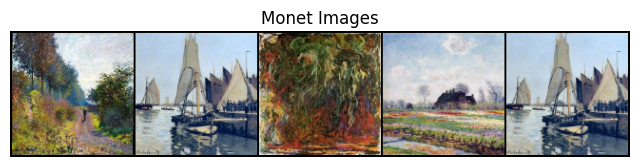

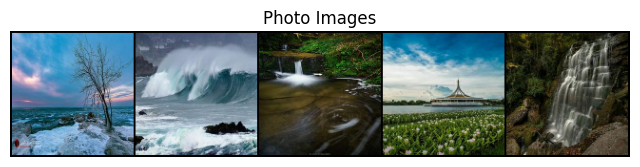

In [6]:
num_images_to_show = 5 

monet_img, photo_img = next(iter(train_loader))
show_images(monet_img[:num_images_to_show], nrow=5, title="Monet Images")
show_images(photo_img[:num_images_to_show], nrow=5, title="Photo Images")

In [7]:
def compute_basic_image_statistics(image_paths):
    stats = {'min': [], 'max': [], 'mean': [], 'median': []}
    for path in image_paths[:5]:  # Sample a few images
        image = np.array(Image.open(path))
        stats['min'].append(image.min())
        stats['max'].append(image.max())
        stats['mean'].append(image.mean())
        stats['median'].append(np.median(image))

    for key in stats:
        print(f"{key.capitalize()} across sampled images: {stats[key]}")

# Usage
compute_basic_image_statistics(train_dataset.monet_images)
compute_basic_image_statistics(train_dataset.photo_images)

Min across sampled images: [0, 0, 0, 0, 0]
Max across sampled images: [255, 255, 255, 255, 255]
Mean across sampled images: [129.00785319010416, 155.7466278076172, 94.49215189615886, 94.05760701497395, 161.27711486816406]
Median across sampled images: [132.0, 158.0, 82.0, 87.0, 174.0]
Min across sampled images: [0, 0, 0, 0, 0]
Max across sampled images: [255, 255, 255, 255, 255]
Mean across sampled images: [82.01350402832031, 143.9656728108724, 80.02882893880208, 141.01891581217447, 77.99877421061198]
Median across sampled images: [76.0, 152.0, 75.0, 153.0, 56.0]


From these basic statistics we can draw a few important conclusions:

- Both Monet images and regular photos have pixel values ranging from 0 to 255.

- The mean values indicate the average brightness of the images. For Monet images, the means seem generally higher, suggesting that these images might be brighter on average than the regular photos. This could be due to Monet's preference for brighter colors or outdoor scenes. In contrast, the regular photos show a lower average brightness, indicating these images might be overall darker or have more variation in lighting conditions.

- The median values provide a robust measure of central tendency. Similar to the mean, the higher median values in Monet images suggest a generally brighter central value. The variation in the median values for both sets also suggests diversity in image content and brightness.

- The differences in brightness between the two sets of images can be a critical factor in how the GAN learns to transform regular photos into Monet-style images.

# Part 3: Model Building and training 

The architecture of the model is designed to progressively break down and analyze the input image, extracting increasingly abstract and relevant features, and finally making a binary decision. This process is integral to the GAN's ability to learn to generate images that are indistinguishable from real ones, as it provides the necessary feedback loop for the generator to improve its outputs.

First, we are defining a Discriminator model for a GAN using PyTorch. The model is structured with two main components: BlockDisc and Discriminator.

- BlockDisc Class: This is a custom block used in building the Discriminator. It consists of a convolutional layer followed by instance normalization and a LeakyReLU activation. The forward method defines how the data flows through this block.

- Discriminator Class: This is the main discriminator model. It starts with an initial convolutional layer followed by a LeakyReLU activation. Then, it dynamically builds more layers based on the features list. Each subsequent layer is an instance of BlockDisc. The final layer is a convolution that maps to a single output channel, suitable for binary classification (real vs. fake). The output is passed through a sigmoid activation function to obtain a probability score.

In [8]:
class BlockDisc(nn.Module):
    def __init__(self, in_channels, out_channels, stride=2):
        super().__init__()
        # A convolutional block with normalization and LeakyReLU activation
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=True, padding_mode="reflect"),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.conv(x)

class Discriminator(nn.Module):
    def __init__(self, in_channels, features=[64, 128, 256, 512]):
        super().__init__()

        # Initial layer without normalization
        self.initial = nn.Sequential(
            nn.Conv2d(in_channels, features[0], kernel_size=4, stride=2, padding=1, padding_mode="reflect"),
            nn.LeakyReLU(0.2),
        )

        layers = [self.initial]
        in_channel = features[0]

        # Building intermediate layers dynamically
        for feature in features[1:]:
            layers.append(
                BlockDisc(in_channel, feature, stride=1 if feature == features[-1] else 2),
            )
            in_channel = feature

        # Final convolution layer to produce a single-channel output
        layers.append(
            nn.Conv2d(in_channel, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect")
        )

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return torch.sigmoid(self.model(x))

    # Optional: Advanced weight initialization
    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.xavier_uniform_(m.weight)


## The generator
This part of the code is structured to generate images from input data through a series of convolutional transformations. The Generator is composed of several types of blocks:

- ConvBlock: This serves as the core building block, capable of performing either standard or transposed convolutions, controlled by the is_encoder flag. It also includes instance normalization and ReLU activation, this is great for stabilizing training and introducing non-linearity.

- ResidualBlock: These blocks, each consisting of two convolutional layers and a skip connection, are used for feature transformation. The skip connection helps mitigate the vanishing gradient problem in deep networks by allowing an alternate pathway for the gradient.

- Generator Architecture: The Generator starts with an initial convolutional layer (initial_layer), followed by a series of encoding ConvBlocks that downsample the input. It then passes the data through multiple ResidualBlocks for deeper feature extraction. Finally, a series of decoding ConvBlocks upsample the feature map back to the original image size. The final_layer uses a Tanh activation function to output the generated image in the expected range.

- Forward Pass: The forward method defines the data flow through these layers, ensuring the transformation of the input to the output image.

- Output Shape Validation: An assertion checks that the output image has the correct dimensions (256x256 in this case).

- Generator Test: The generator_test function is a simple test to ensure the Generator can process an input tensor and produce an output of the expected shape.

In [9]:
import torch
import torch.nn as nn

class ConvBlock(nn.Module):
    """
    A convolutional block used in the Generator. 
    It can perform either standard convolution or transposed convolution 
    based on the 'is_encoder' flag.
    Includes instance normalization and ReLU activation.
    """
    def __init__(self, in_channels, out_channels, is_encoder=True, **kwargs):
        super().__init__()
        if is_encoder:
            self.conv = nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
        else:
            self.conv = nn.ConvTranspose2d(in_channels, out_channels, **kwargs)
        self.normalization = nn.InstanceNorm2d(out_channels)
        self.activation = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.activation(self.normalization(self.conv(x)))


class ResidualBlock(nn.Module):
    """
    Implements a residual block with two convolutional layers and a skip connection.
    Helps in preserving the network's ability to effectively train deeper architectures.
    """
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1, stride=1, padding_mode="reflect"),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1, stride=1, padding_mode="reflect"),
            nn.InstanceNorm2d(channels),
        )

    def forward(self, x):
        return x + self.block(x)


class Generator(nn.Module):
    """
    Generator model in GAN. Composed of an initial convolution, 
    a series of ConvBlocks for encoding and decoding, 
    several ResidualBlocks for transformation, and a final convolution.
    The model outputs generated images with characteristics learned from the input data.
    """
    def __init__(self, in_channels, num_features=64, num_residuals=6):
        super().__init__()
        self.initial_layer = nn.Sequential(
            nn.Conv2d(in_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )

        self.encoder_blocks = nn.ModuleList([
            ConvBlock(num_features, num_features*2, is_encoder=True, kernel_size=3, stride=2, padding=1),
            ConvBlock(num_features*2, num_features*4, is_encoder=True, kernel_size=3, stride=2, padding=1),
        ])

        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4) for _ in range(num_residuals)]
        )

        self.decoder_blocks = nn.ModuleList([
            ConvBlock(num_features*4, num_features*2, is_encoder=False, kernel_size=3, stride=2, padding=1, output_padding=1),
            ConvBlock(num_features*2, num_features, is_encoder=False, kernel_size=3, stride=2, padding=1, output_padding=1),
        ])

        self.final_layer = nn.Sequential(
            nn.Conv2d(num_features, in_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.initial_layer(x)
        for layer in self.encoder_blocks:
            x = layer(x)
        x = self.residual_blocks(x)
        for layer in self.decoder_blocks:
            x = layer(x)
        x = self.final_layer(x)
#         assert x.shape[2:4] == (256, 256), f"The output shape is not 256x256, instead we got {x.shape[2:4]}"
        return x

# Test function to validate the Generator's output
def generator_test():
    x = torch.randn((10, 3, 128, 128))
    generator = Generator(in_channels=3, num_residuals=6)
    generated_img = generator(x)
    print(f"Generated Image Shape: {generated_img.shape}")
    
generator_test()

Generated Image Shape: torch.Size([10, 3, 128, 128])


## Supporting functions
- Plotting: We want to create a way to visualize the training losses of both the Generator and Discriminator. Here we creates a line plot where the x-axis represents the number of iterations, and the y-axis shows the loss. This visualization is crucial for monitoring the training process, ensuring both networks are learning effectively and identifying potential issues like model convergence or oscillation in loss.

- Save Checkpoint: With these models it is crucial that we can save the state of a model and its optimizer at a particular point during training. This is important for preserving the model's learned parameters, allowing for training to be paused and resumed without loss of progress. It's also useful for later evaluation or fine tuning of the model.

In [10]:
import matplotlib.pyplot as plt
import torch

def plot(g_loss, d_loss, smoothing=False):
    plt.figure(figsize=(10, 5))
    plt.title("Generator and Discriminator Loss During Training")

    if smoothing:
        g_loss = np.convolve(g_loss, np.ones((10,))/10, mode='valid')
        d_loss = np.convolve(d_loss, np.ones((10,))/10, mode='valid')

    plt.plot(g_loss, label="Generator")
    plt.plot(d_loss, label="Discriminator")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig('training_loss.png')  # Save the plot as a file
    plt.show()

# Enhanced save_checkpoint function
def save_checkpoint(model, optimizer, file_name="my_checkpoint.pth.tar"):
    print("Saving checkpoint...")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
        # Add more elements as needed
    }
    try:
        torch.save(checkpoint, file_name)
        print("Checkpoint saved successfully to", file_name)
    except Exception as e:
        print("Error saving checkpoint:", e)

Now we are preparing and configuring key components for the training of the model. This setup involves initializing two discriminator models (disc_P and disc_M) and two generator models (gen_P and gen_M), each designed to work on images with three channels. The discriminators aim to distinguish between real and generated images, while the generators are tasked with creating believable fake images. Both the discriminators and generators are transferred to the designated compute device. For training these models, we set up two Adam optimizers one for the discriminators (opt_disc) and one for the generators (opt_gen) with specific learning rates and momentum terms. Additionally, we define L1 and mean squared error (MSE) loss functions. We also introduce learning rate schedulers (lr_scheduler_D and lr_scheduler_G) with a lambda function determining the learning rate decay, to adjust the learning rate as training progresses. This setup is essential for effectively training the GAN, as it controls how the models learn and adapt over time, aiming to produce high quality generated images.

In [11]:
import itertools

# Configuration dictionary
config = {
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "lr_disc": 2e-4,
    "lr_gen": 2e-4,
    "betas": (0.5, 0.999),
    "num_residuals": 9,
    "decay_epoch": 20,
    "num_epochs": 30,
}

# Function to create models
def create_model(model_class, in_channels):
    if model_class == Generator:
        return model_class(in_channels, num_residuals=config["num_residuals"]).to(config["device"])
    elif model_class == Discriminator:
        return model_class(in_channels).to(config["device"])
    
# Function to create optimizers
def create_optimizer(model_parameters, lr):
    return optim.Adam(model_parameters, lr=lr, betas=config["betas"])

# Initializing models
disc_P = create_model(Discriminator, in_channels=3)
disc_M = create_model(Discriminator, in_channels=3)
gen_P = create_model(Generator, in_channels=3)
gen_M = create_model(Generator, in_channels=3)

# Initializing optimizers
opt_disc = create_optimizer(itertools.chain(disc_P.parameters(), disc_M.parameters()), config["lr_disc"])
opt_gen = create_optimizer(itertools.chain(gen_P.parameters(), gen_M.parameters()), config["lr_gen"])

# Loss functions
L1_loss = nn.L1Loss()
mse_loss = nn.MSELoss()

# Lambda function for learning rate decay
lambda_lr_decay = lambda epoch: 1 - max(0, epoch - config["decay_epoch"]) / (config["num_epochs"] - config["decay_epoch"])

# Learning rate schedulers
lr_scheduler_D = torch.optim.lr_scheduler.LambdaLR(opt_disc, lr_lambda=lambda_lr_decay)
lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(opt_gen, lr_lambda=lambda_lr_decay)

# Test the device setup
print(f"Using device: {config['device']}")

Using device: cuda


### Executing the model

Now, we executethe model. Here is a breakdown of our approach and functions:

- Discriminator and Generator Loss Functions: The calculate_discriminator_loss function computes the loss for the discriminator by assessing how well it differentiates between real images and fake images produced by the generator.The calculate_generator_loss function calculates the generator's loss. This loss is multifaceted: it includes not only the generator's ability to fool the discriminator but also ensures the generated image retains certain characteristics of the original image and maintains its core identity.

- Training Procedure: During training, the model iterates over batches of images. For each batch, the generator creates 'fake' images from the input images.The discriminator is then updated to get better at distinguishing real images from these fakes. This update involves calculating the discriminator loss and adjusting the model parameters accordingly. Similarly, the generator is updated to improve its ability to create convincing fake images that the discriminator will classify as real. This update uses the generator loss, incorporating aspects like image fidelity and content preservation.

- Efficiency and Monitoring: Mixed precision training, via torch.cuda.amp.GradScaler, is used here to make the training process faster and more memory efficient.The training loop includes logging of losses and periodic image display, which allows for monitoring the model's performance and progression visually.

- Learning Rate Schedulers and Model Checkpoints: Learning rate schedulers adjust the learning rate during training, which can help in improving the model's training efficiency and effectiveness.The model's state is saved at regular intervals. This practice, known as checkpointing, is crucial for long training processes as it allows for recovery in case of interruptions and provides snapshots of the model at different stages of training.

  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 1


100%|██████████| 880/880 [08:57<00:00,  1.64it/s, d_loss=0.11, g_loss=5.88]


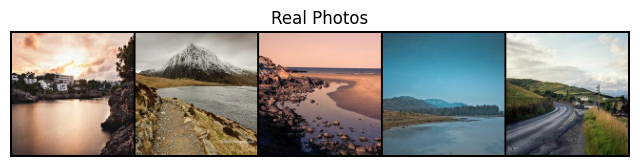

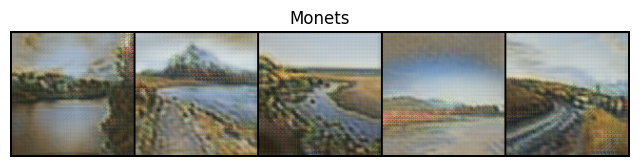

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 2


100%|██████████| 880/880 [08:55<00:00,  1.64it/s, d_loss=0.141, g_loss=5.94]


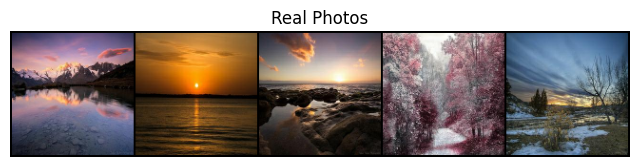

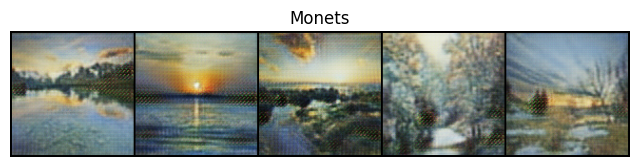

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 3


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.147, g_loss=5.62]


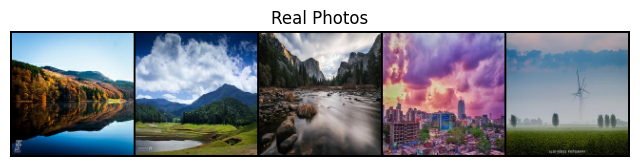

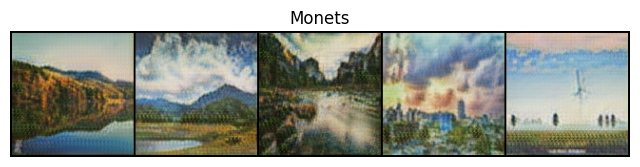

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 4


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.044, g_loss=5.74]


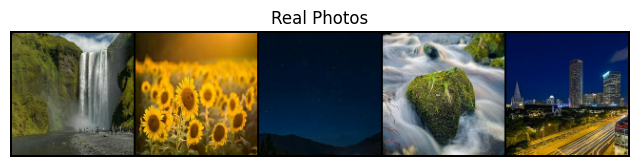

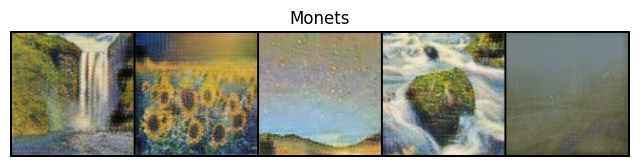

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 5


100%|██████████| 880/880 [08:55<00:00,  1.64it/s, d_loss=0.0257, g_loss=5.95]


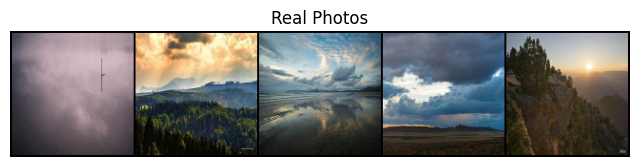

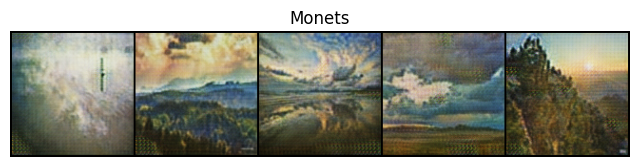

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 6


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.00834, g_loss=5.41]


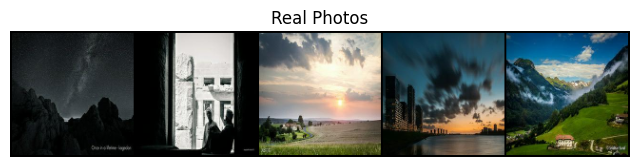

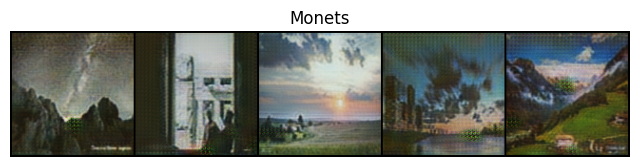

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 7


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.062, g_loss=5.78]


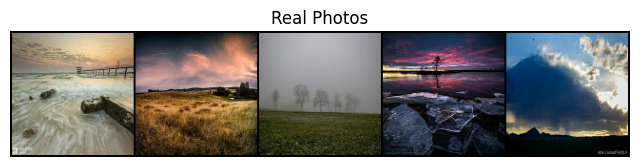

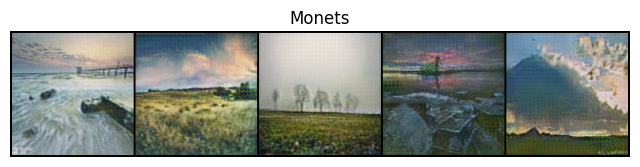

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 8


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0521, g_loss=5.22]


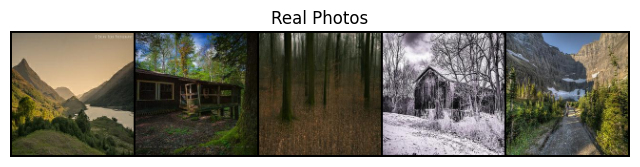

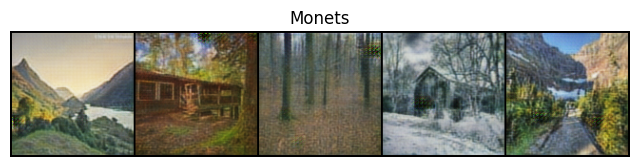

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 9


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0249, g_loss=5.49]


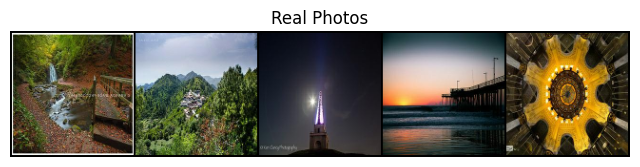

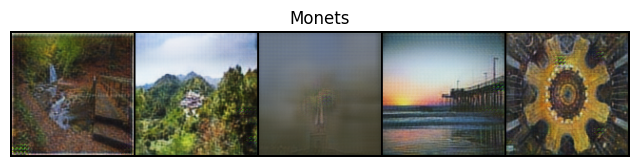

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 10


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.067, g_loss=5.33]


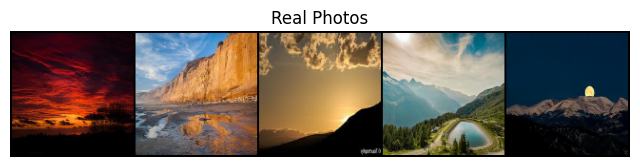

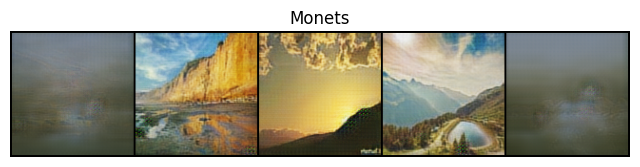

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 11


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0258, g_loss=5.21]


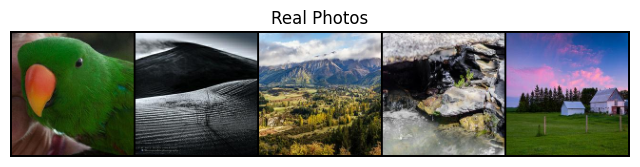

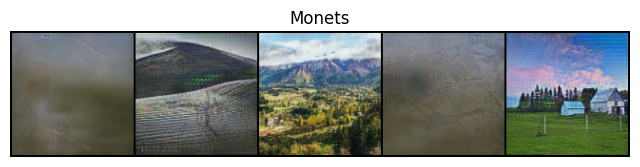

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 12


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0022, g_loss=5.24]


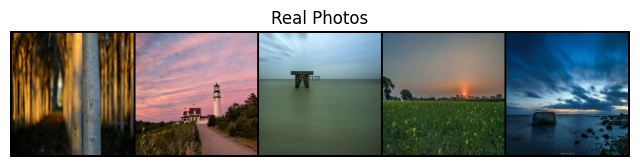

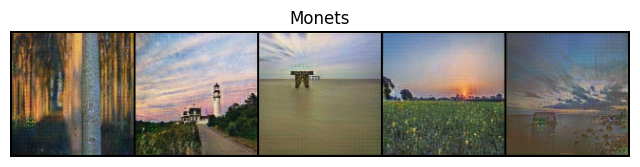

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 13


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.103, g_loss=5.48]


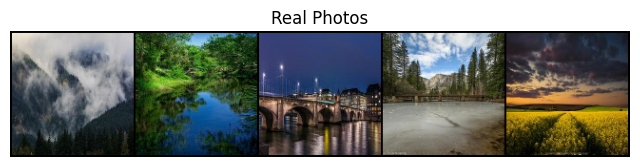

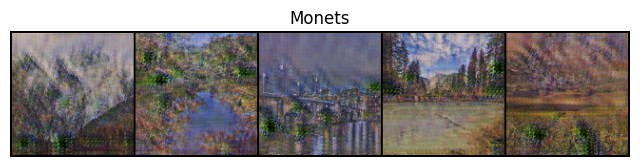

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 14


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0961, g_loss=5.06]


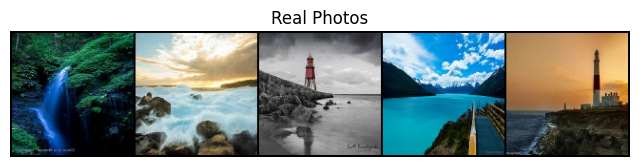

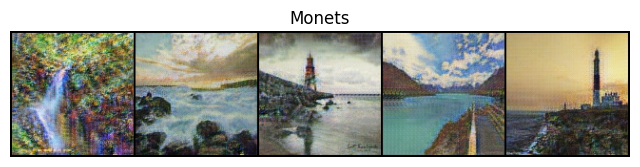

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 15


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0018, g_loss=5.4]


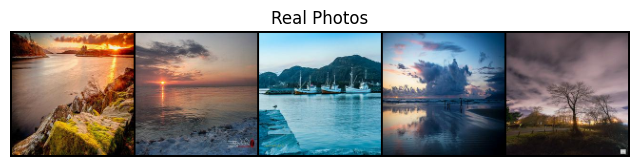

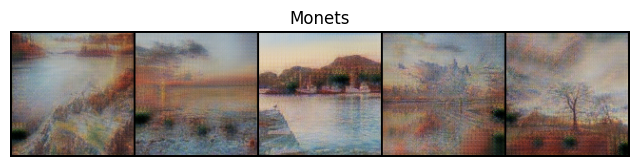

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 16


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.00542, g_loss=5.59]


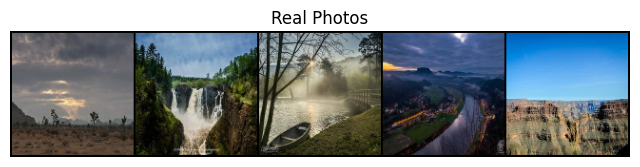

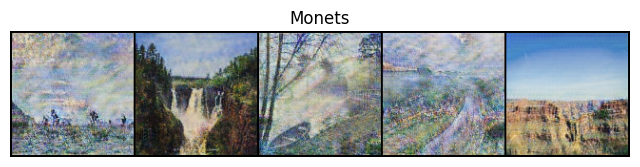

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 17


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.00662, g_loss=5.76]


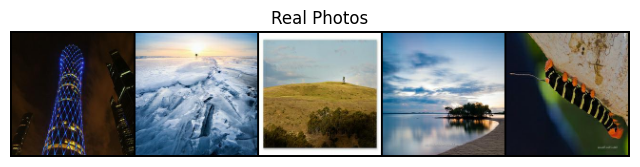

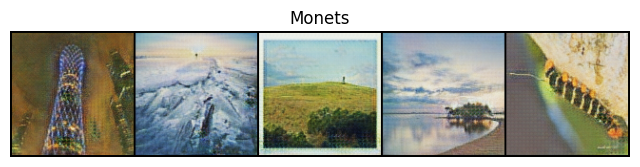

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 18


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0647, g_loss=5.01]


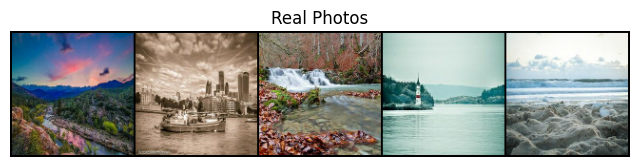

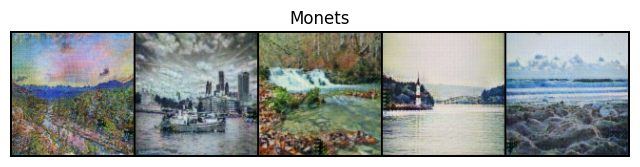

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 19


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0018, g_loss=5.21]


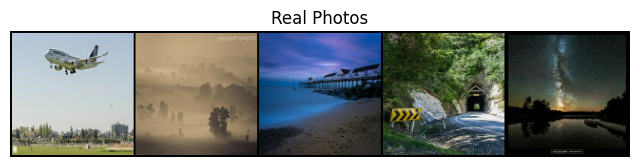

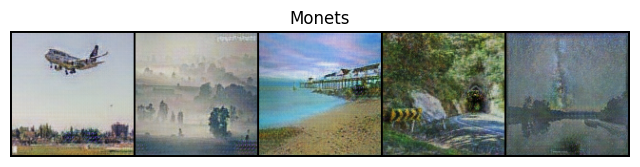

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 20


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.00916, g_loss=6.02]


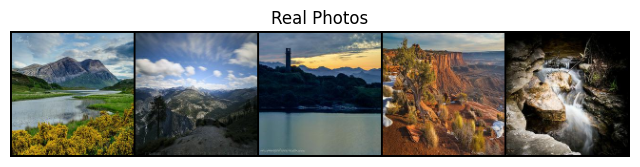

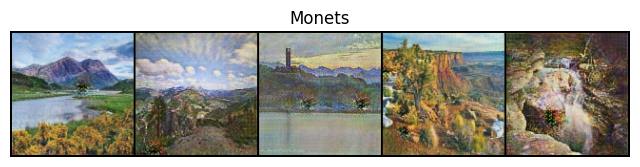

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 21


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.00293, g_loss=5.29]


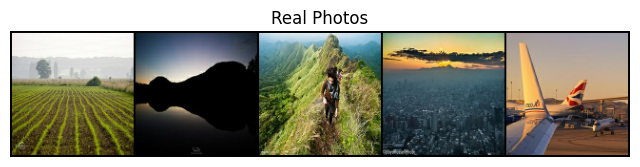

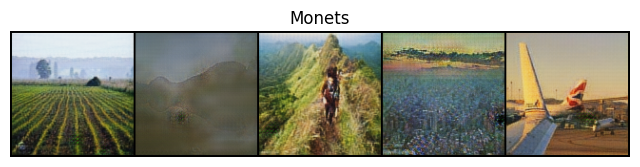

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 22


100%|██████████| 880/880 [08:57<00:00,  1.64it/s, d_loss=0.00015, g_loss=4.95]


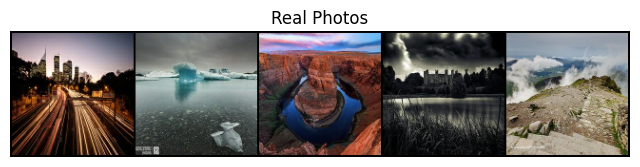

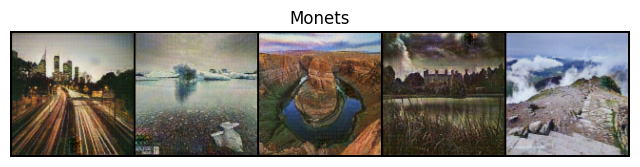

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 23


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0211, g_loss=5.59]


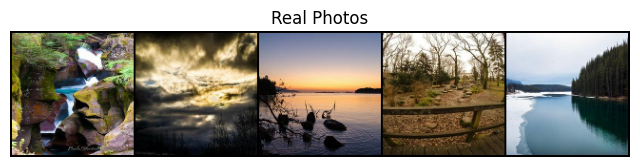

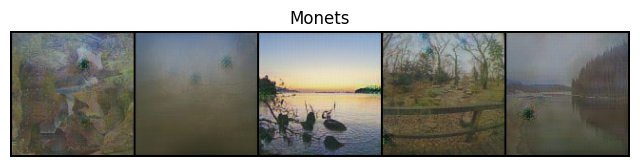

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 24


100%|██████████| 880/880 [08:57<00:00,  1.64it/s, d_loss=0.00145, g_loss=5.31]


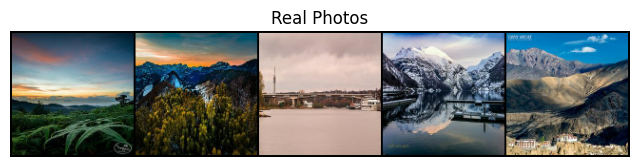

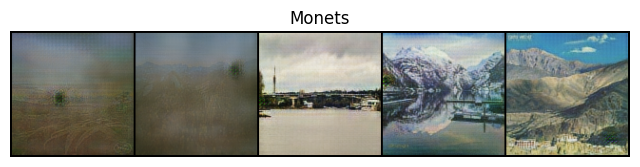

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 25


100%|██████████| 880/880 [08:57<00:00,  1.64it/s, d_loss=0.00196, g_loss=5.42]


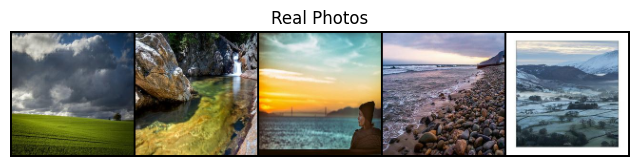

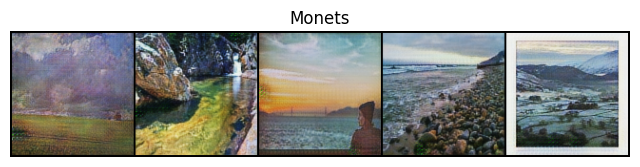

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 26


100%|██████████| 880/880 [08:57<00:00,  1.64it/s, d_loss=0.0117, g_loss=4.88]


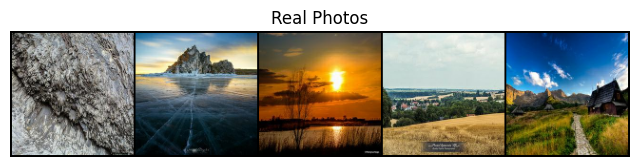

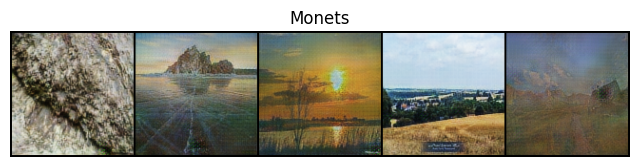

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 27


100%|██████████| 880/880 [08:57<00:00,  1.64it/s, d_loss=0.11, g_loss=5.7]


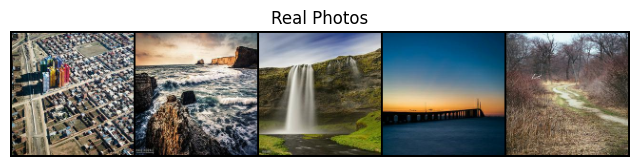

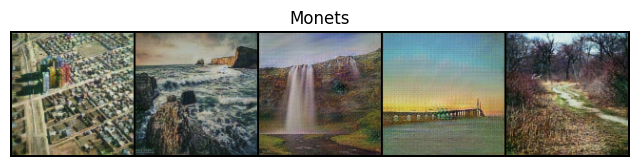

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 28


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0723, g_loss=5.21]


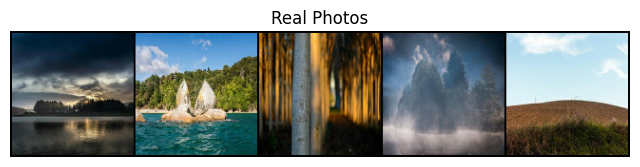

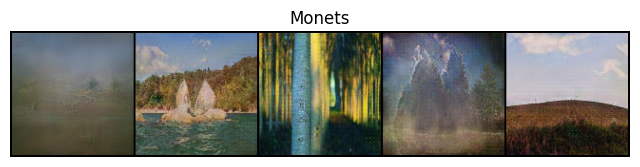

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 29


100%|██████████| 880/880 [08:57<00:00,  1.64it/s, d_loss=0.0819, g_loss=4.99]


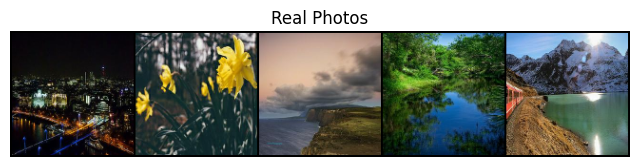

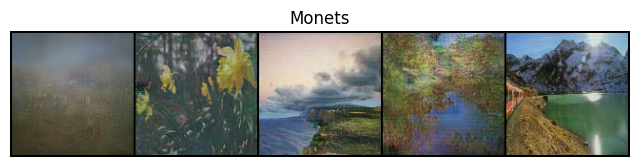

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


  0%|          | 0/880 [00:00<?, ?it/s]

EPOCH 30


100%|██████████| 880/880 [08:56<00:00,  1.64it/s, d_loss=0.0933, g_loss=4.79]


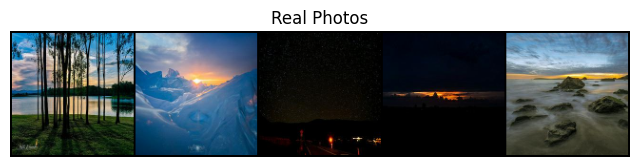

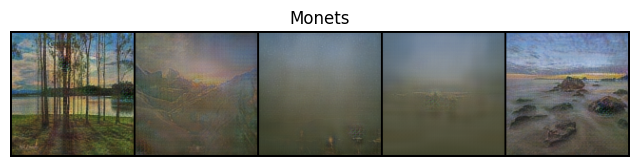

Saving checkpoint...
Checkpoint saved successfully to discM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to discP.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genM.pth.tar
Saving checkpoint...
Checkpoint saved successfully to genP.pth.tar


In [12]:
def calculate_discriminator_loss(disc, real, fake, loss_function):
    real_output = disc(real)
    fake_output = disc(fake.detach())
    
    # Creating target tensors that match the output size of the discriminator
    real_target = torch.ones_like(real_output)
    fake_target = torch.zeros_like(fake_output)
    
    real_loss = loss_function(real_output, real_target)
    fake_loss = loss_function(fake_output, fake_target)
    
    return real_loss + fake_loss

def calculate_generator_loss(disc, fake, loss_function, cycle_loss_function, identity_loss_function, real, cycle, identity, lambda_cycle, lambda_identity):
    disc_output = disc(fake)
    target = torch.ones_like(disc_output)

    adversarial_loss = loss_function(disc_output, target)
    cycle_loss = cycle_loss_function(real, cycle)
    identity_loss = identity_loss_function(real, identity)

    return adversarial_loss + lambda_cycle * cycle_loss + lambda_identity * identity_loss


def display_images(img, title, nrow=5):
    with torch.no_grad():
        show_images(img=img[:5], nrow=nrow, title=title)

def save_model(model, optimizer, file_name):
    if hyperparams["save_model"]:
        save_checkpoint(model, optimizer, file_name=file_name)
        
d_scaler = torch.cuda.amp.GradScaler()
g_scaler = torch.cuda.amp.GradScaler()


D_LOSS = []
G_LOSS = []

# Training Loop
for epoch in range(config['num_epochs']):
    loop = tqdm(train_loader, leave=True)
    print(f"EPOCH {epoch+1}")

    for idx, (monet, photo) in enumerate(loop):
        monet, photo = monet.to(device), photo.to(device)

        # DISCRIMINATOR UPDATE
        with torch.cuda.amp.autocast():
            fake_monet = gen_M(photo)
            fake_photo = gen_P(monet)
            d_m_loss = calculate_discriminator_loss(disc_M, monet, fake_monet, mse_loss)
            d_p_loss = calculate_discriminator_loss(disc_P, photo, fake_photo, mse_loss)
            d_loss = (d_m_loss + d_p_loss) / 2

        opt_disc.zero_grad()
        d_scaler.scale(d_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # GENERATOR UPDATE
        with torch.cuda.amp.autocast():
            g_m_loss = calculate_generator_loss(disc_M, fake_monet, mse_loss, L1_loss, L1_loss, monet, gen_P(fake_monet), gen_M(monet), hyperparams["lambda_cycle_consistency"], hyperparams["lambda_identity"])
            g_p_loss = calculate_generator_loss(disc_P, fake_photo, mse_loss, L1_loss, L1_loss, photo, gen_M(fake_photo), gen_P(photo), hyperparams["lambda_cycle_consistency"], hyperparams["lambda_identity"])
            g_loss = (g_m_loss + g_p_loss) / 2

        opt_gen.zero_grad()
        g_scaler.scale(g_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        # LOGGING
        D_LOSS.append(d_loss.item())
        G_LOSS.append(g_loss.item())

        if idx % 200 == 0:
            loop.set_postfix(d_loss=d_loss.item(), g_loss=g_loss.item())

    display_images(photo, "Real Photos")
    display_images(fake_monet.type(torch.float64), "Monets")

    lr_scheduler_D.step()
    lr_scheduler_G.step()

    # Save Checkpoints
    save_model(disc_M, opt_disc, checkpoint_paths["discriminator_monet"])
    save_model(disc_P, opt_disc, checkpoint_paths["discriminator_photo"])
    save_model(gen_M, opt_gen, checkpoint_paths["generator_monet"])
    save_model(gen_P, opt_gen, checkpoint_paths["generator_photo"])


# Part 4: Results and conclusions


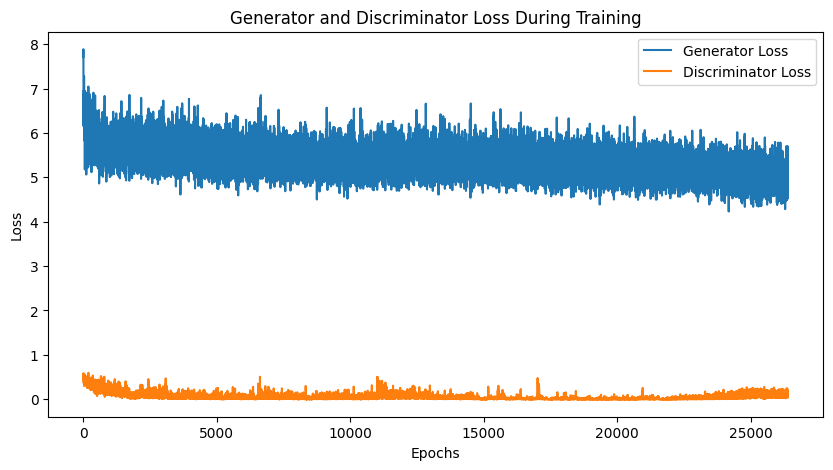

In [13]:
import matplotlib.pyplot as plt

epochs = range(1, len(G_LOSS) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, G_LOSS, label='Generator Loss')
plt.plot(epochs, D_LOSS, label='Discriminator Loss')
plt.title('Generator and Discriminator Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


The graph displays the loss of the generator and discriminator of a Generative Adversarial Network (GAN) over a number of iterations during training.
Based on the graph and the quality of the images across the epochs we can draw the following conlcusions:

- Discriminator Performance: The discriminator's loss is relatively low and stable, which indicates that it's performing well in distinguishing between the real Monet images and the generated images. The low variance in loss suggests that the discriminator is confident in its predictions.

- Generator Performance: The generator's loss starts high and then sees a general decrease, but it remains higher than the discriminator's loss and shows more variability. This is typical in GAN training as the generator usually struggles more to learn how to create convincing images. The fluctuations and spikes in the generator's loss could indicate that it is still learning and adjusting its parameters to better fool the discriminator.

- Training Stability: The overall downward trend in the generator's loss and the low discriminator loss suggest that the training process is relatively stable. However, the spikes in the generator's loss might also suggest periods of instability where the generator makes significant changes to its approach.

- Convergence: The fact that neither loss converges to zero implies that the GAN is maintaining a competitive environment between the generator and discriminator. This is important because if either loss were to drop to zero, it would mean that one of the networks has outperformed the other completely, which is not ideal for GAN training.

- Quality of Generated Images: There is some variability in the quality of generated images, with occasional poor outcomes, is not uncommon in GAN training. Overall, by Epoch 30, the quality of the image is pretty accurate preserving Monet's style.

### **In conclusion, the GAN seems to be training properly with the discriminator maintaining a steady performance and the generator showing gradual improvement as well as generating quality images and preserving Monet's style.**

-----------------------------------------------------------------------------------------------------------------------------------------------------

**Improving the model**

Because of time and computational constraints, we are unable to improve upon the current model as well as compare it against other models. To be able to run 30 epochs of the current model requires about 300 minutes of computational time using GPU100 which has a 30hr quota per week. Exploring different models with hyperparameter tunning, adjusting the learning rate, more complex architecture or running more epochs, would require significantly more time and resources.

-----------------------------------------------------------------------------------------------------------------------------------------------------

### Submission

For our submission we first standardize and transform the images into tensors, then we feed them into the generator model. The model generates new images based on its training (like style transfer). These generated images are then converted back to regular image format and saved in a the images directory. The process is done in batches to efficiently handle large sets of images, particularly useful for high volume image processing tasks while managing system memory usage effectively.

In [14]:
## Creating save_dir if it doesnt exsist
save_dir = '../images'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [15]:
# Define image transformations: convert images to tensor and normalize values
generate_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Transformation to convert tensors back to PIL Image format
tensor_to_image = transforms.ToPILImage()

# Set the generator model to evaluation mode
gen_M.eval()

# Directory containing the input photos for style transformation
data_dir = "/kaggle/input/gan-getting-started/photo_jpg"

# List of file paths for all images in the input directory
input_photo_files  = [os.path.join(data_dir, name) for name in os.listdir(data_dir)]

# Determine the tensor data type based on CUDA availability
Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.Tensor

# Iterate through the image files in batches
for i in range(0, len(input_photo_files), hyperparams["batch_size"]):
    # read images
    batch_images  = []
    
    # Read and process images in the current batch
    for j in range(i, min(len(input_photo_files), i + hyperparams["batch_size"])):
        img = Image.open(input_photo_files[j])
        img = generate_transforms(img)
        batch_images .append(img)
    batch_images  = torch.stack(batch_images , 0).type(Tensor)
    
    # Use the generator model to transform images into the target style
    generated_images  = gen_M(batch_images ).detach().cpu()
    
    # Save the generated images to the output directory
    for j in range(generated_images .size(0)):
        img = generated_images [j].squeeze().permute(1, 2, 0)
        img_arr = img.numpy()
        img_arr = (img_arr - np.min(img_arr)) * 255 / (np.max(img_arr) - np.min(img_arr))
        img_arr = img_arr.astype(np.uint8)
        
        img = tensor_to_image(img_arr)
        _, name = os.path.split(input_photo_files[i+j])
        img.save(os.path.join(save_dir, name))

In [16]:
## taking the files from images directory and converting them to a zip file
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'